In [1]:
import matplotlib.pyplot as plt
import random
import numpy as np
from sklearn.cluster import KMeans
from sklearn import decomposition
from sklearn import preprocessing
from pathlib import Path
import scipy.io
import py_pcha
import os
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
import random
import numpy as np
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import decomposition
from sklearn import preprocessing
from pathlib import Path
import scipy.io
import py_pcha
from sklearn.decomposition import PCA
import ttictoc as t
import seaborn as sns
import skimage
from skimage import data, draw, io

In [3]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

In [4]:
# load labels
labels=pd.read_csv('labels.csv',names=['age','gender','race']) # gender 0 male, 1 female (Races from 0 to 4)
labels.head()

,age,gender,race
0,100,0,0
1,100,0,0
2,100,1,0
3,100,1,0
4,100,1,0


In [5]:
data_paths = os.listdir('Faces')
n=len(data_paths)
p=200*200 # we add the label as the first element
X=np.zeros([n,p])
race=np.zeros(n)
gender=np.zeros(n)
age=np.zeros(n)
print(f'number of observations: {n}, number of features: {p}')
# load images
for idx,el in enumerate(data_paths):
    img=plt.imread('Faces/'+el)
    img_gray=rgb2gray(img)
    img_gray_norm=img_gray/255.0
    flatten=img_gray_norm.flatten()
    # get the label
    race[idx]=labels.iloc[int(el[:-4]),2]
    gender[idx]=labels.iloc[int(el[:-4]),1]
    age[idx]=labels.iloc[int(el[:-4]),0]
    # hstack label (as the first element) and pixels
    # features=np.hstack((race,flatten))
    X[idx]=flatten

number of observations: 23705, number of features: 40000


In [6]:
X.shape

(23705, 40000)

### Filtering for race and gender

In [7]:
gender

array([0., 1., 0., ..., 0., 1., 1.])

In [8]:
race

array([4., 3., 0., ..., 3., 0., 3.])

In [9]:
categories=[]
for idx,r in enumerate(race):
    if gender[idx]==0:
        categories.append(int(r))
    else:
        categories.append(int(r+10))
categories=np.array(categories)
categories.shape

(23705,)

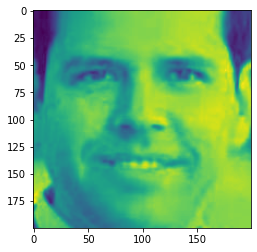

In [10]:
aaa=X[0].reshape(200,200).copy()
plt.imshow(aaa)

### Extract the info around a circle

In [11]:
IMG_example=X[0].reshape(200,200).copy()
# draw default disk
row, col = draw.disk((100,100), 100)

points_example=IMG_example[row, col]
p2=len(points_example)

data_points=np.zeros([n,p2])
for idx,el in enumerate(X):
    data_points[idx]=el.reshape(200,200)[row,col]
    
data_points.shape

(23705, 31397)

In [12]:
X.shape

(23705, 40000)

In [13]:
# apply binary thresholding
# ret, thresh = cv2.threshold(aaa, 150, 255, cv2.THRESH_BINARY)
# visualize the binary image

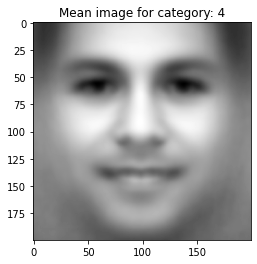

(760, 40000)

In [14]:
def substract_mean_img(cat_num,n_components_PCA=100,plot=True):
    subset=X[categories==cat_num]
    # substract the mean image from each subset to perform PCA
    mean_img=np.mean(subset,axis=0)
    if plot==True:
        plt.figure()
        plt.title('Mean image for category: ' + str(cat_num))
        plt.imshow(mean_img.reshape(200,200),cmap='gray')
        plt.show()
    X_non_mean=np.array([img-mean_img for img in subset])
    
    
    return X_non_mean

AAA=substract_mean_img(4)
AAA.shape

### Extract around elipsoid

In [15]:
IMG_example=X[0].reshape(200,200).copy()
# draw default disk
row, col = draw.disk((100,100), 100)

points_example=IMG_example[row, col]
p2=len(points_example)

data_points=np.zeros([n,p2])
for idx,el in enumerate(X):
    data_points[idx]=el.reshape(200,200)[row,col]
    
data_points.shape

(23705, 31397)

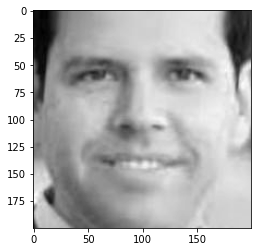

In [16]:
plt.imshow(IMG_example,cmap='gray');plt.show()

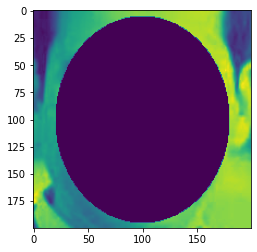

In [17]:
IMG_example=X[0].reshape(200,200).copy()
row, col = draw.ellipse(100,100, 95, 80)

IMG_example[row, col] = 0

plt.imshow(IMG_example);plt.show()

In [18]:
def PCA_per_category_without_circle(cat_num,n_components_PCA=100,plot=True):
    subset=X[categories==cat_num]
    # substract the mean image from each subset to perform PCA
    mean_img=np.mean(subset,axis=0)
    if plot==True:
        plt.figure()
        plt.title('Mean image for category: ' + str(cat_num))
        plt.imshow(mean_img.reshape(200,200),cmap='gray')
        plt.show()
    X_non_mean=np.array([img-mean_img for img in subset])
    # Perform PCA
    pca = PCA(n_components=n_components_PCA)
    pca_scores=pca.fit_transform(X_non_mean)
    Scores=pd.DataFrame(pca_scores)
    # add age in the df
    Scores['age']=age[categories==cat_num].astype('uint8')
    return pca_scores,Scores

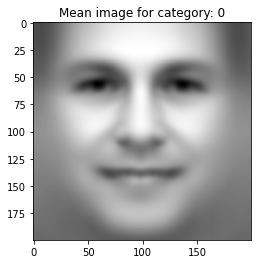

In [19]:
def PCA_per_category(cat_num,n_components_PCA=100,plot=True):
    subset=X[categories==cat_num]
    # substract the mean image from each subset to perform PCA
    mean_img=np.mean(subset,axis=0)
    if plot==True:
        plt.figure()
        plt.title('Mean image for category: ' + str(cat_num))
        plt.imshow(mean_img.reshape(200,200),cmap='gray')
        plt.show()
    X_non_mean=np.array([img-mean_img for img in subset])
    # Extract all the points inside a circle
    row, col = draw.disk((100,100), 100)
    X_circle=[el.reshape(200,200)[row,col] for el in X_non_mean]
    # Perform PCA
    pca = PCA(n_components=n_components_PCA)
    pca_scores=pca.fit_transform(X_circle)
    Scores=pd.DataFrame(pca_scores)
    # add age in the df
    Scores['age']=age[categories==cat_num].astype('uint8')
    return pca_scores,Scores

[pca_s,S]=PCA_per_category(0)

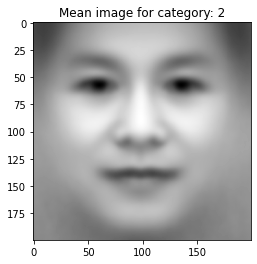

In [20]:
def PCA_per_category_ellipse(cat_num,n_components_PCA=100,plot=True):
    subset=X[categories==cat_num]
    # substract the mean image from each subset to perform PCA
    mean_img=np.mean(subset,axis=0)
    if plot==True:
        plt.figure()
        plt.title('Mean image for category: ' + str(cat_num))
        plt.imshow(mean_img.reshape(200,200),cmap='gray')
        plt.show()
    X_non_mean=np.array([img-mean_img for img in subset])
    # Extract all the points inside a circle
    row, col = draw.ellipse(100,100, 95, 80)
    X_circle=[el.reshape(200,200)[row,col] for el in X_non_mean]
    # Perform PCA
    pca = PCA(n_components=n_components_PCA)
    pca_scores=pca.fit_transform(X_circle)
    Scores=pd.DataFrame(pca_scores)
    # add age in the df
    Age_vector=age[categories==cat_num].astype('uint8')
    return pca_scores,Scores,Age_vector

[pca_s,S,_]=PCA_per_category_ellipse(2)

In [21]:
def run_Kmeans(pca_scores,Scores_df,clusters=5,plot=True,category="Not_defined"):
    # Declaring Model
    model = KMeans(n_clusters=clusters)
    # Fitting Model
    model.fit(pca_scores)
    # Prediction on the subset data
    all_predictions = model.predict(pca_scores)
    if plot==True:
        plt.figure(figsize=(10,6));sns.scatterplot(Scores_df[0],Scores_df[1],hue=all_predictions,palette="viridis");
        plt.title('Category: '+str(category)+'. Clusters when k_means=5 applied');plt.savefig(category+".png");plt.show()
    return all_predictions

#pred=run_Kmeans(pca_s,S)

### Reconstruct an image from each cluster

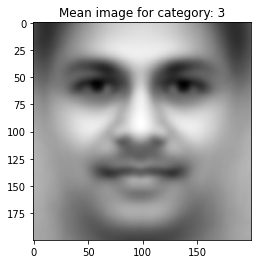

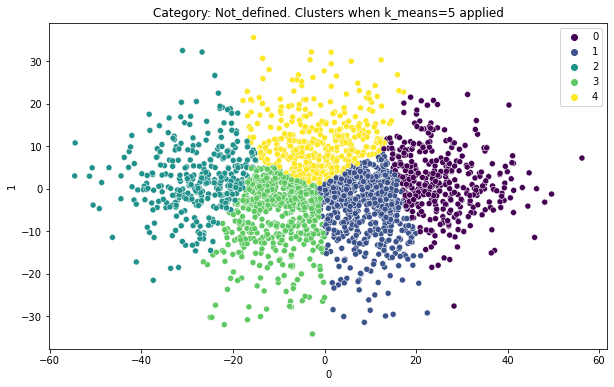

In [22]:
subset=X[categories==3]
[pca_s,S,_]=PCA_per_category_ellipse(3)
pred=run_Kmeans(pca_s,S)

In [23]:
subset[pred==2].shape

(347, 40000)

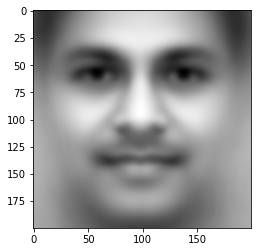

In [24]:
subs_0=subset[pred==0]
mean_img_0=np.mean(subset,axis=0)
plt.imshow(mean_img_0.reshape(200,200),cmap='gray');plt.show()

In [25]:
subs_0.shape

(403, 40000)

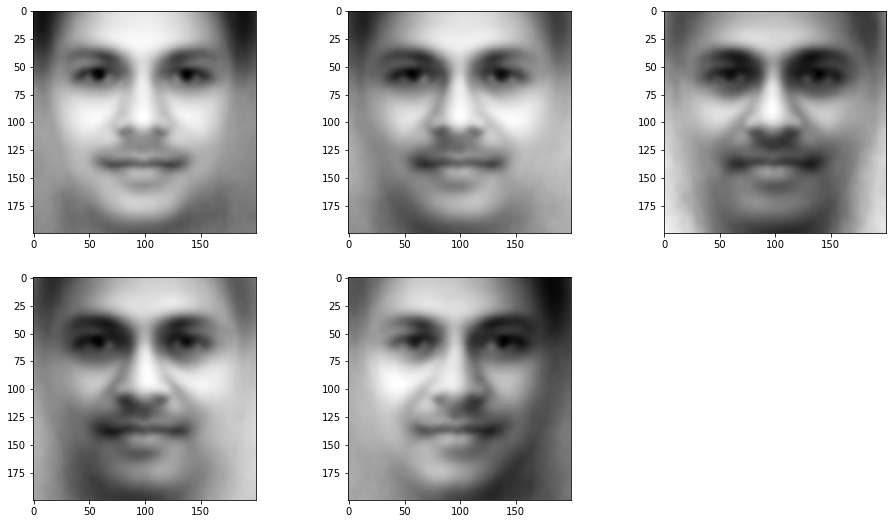

In [26]:
plt.figure(figsize=(16,9))
for i in range(0,5):
    plt.subplot(2,3,i+1)
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

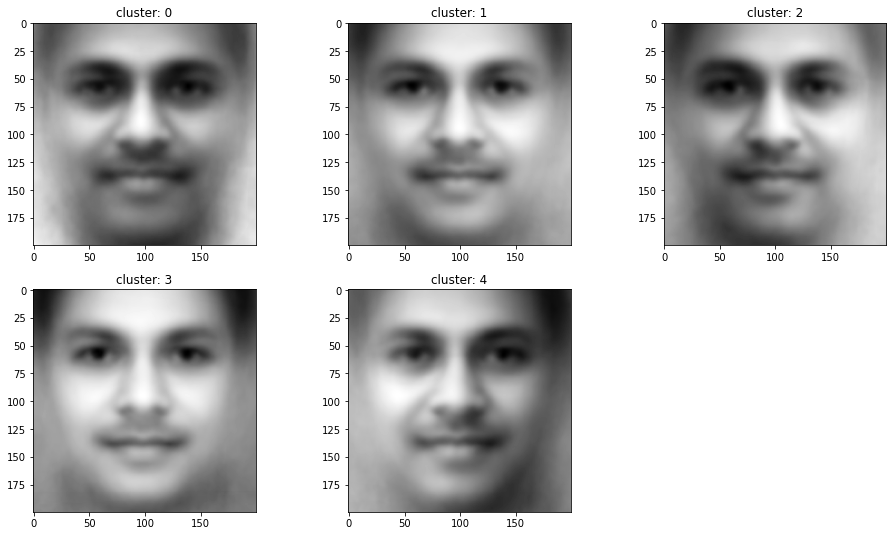

In [27]:
def mean_face_per_category(category):
    subset=X[categories==category]
    [pca_s,S,_]=PCA_per_category_ellipse(category,plot=False)
    pred=run_Kmeans(pca_s,S,plot=False)
    plt.figure(figsize=(16,9))
    for i in range(0,5):
        plt.subplot(2,3,i+1)
        subs_0=subset[pred==i]
        mean_img_0=np.mean(subs_0,axis=0)
        plt.title("cluster: "+str(i))
        plt.imshow(mean_img_0.reshape(200,200),cmap='gray')
        
mean_face_per_category(3)

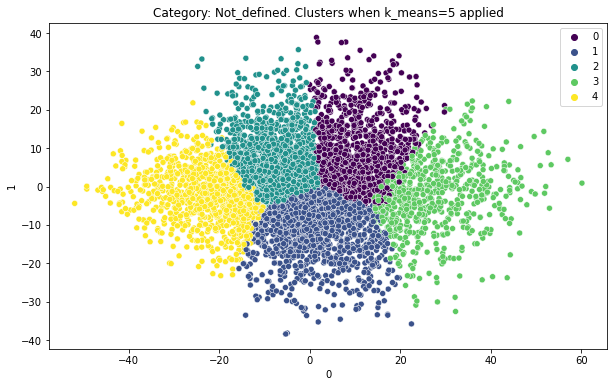

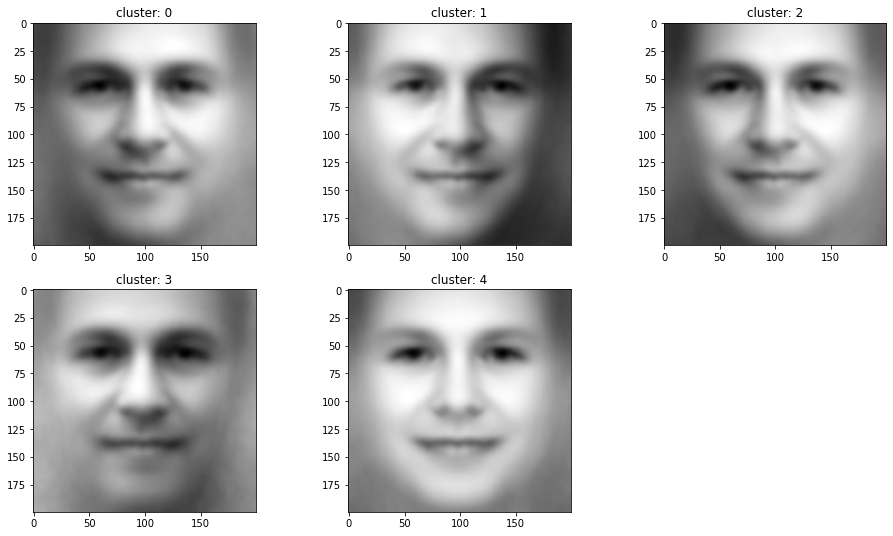

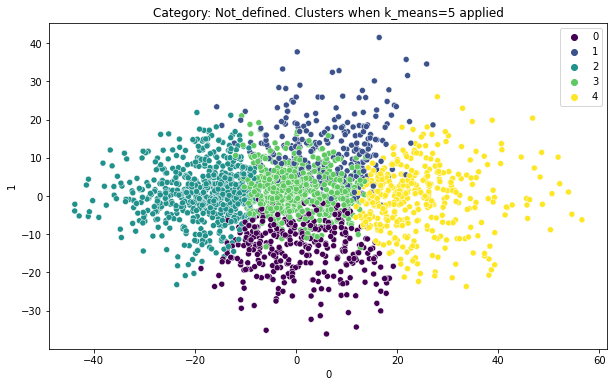

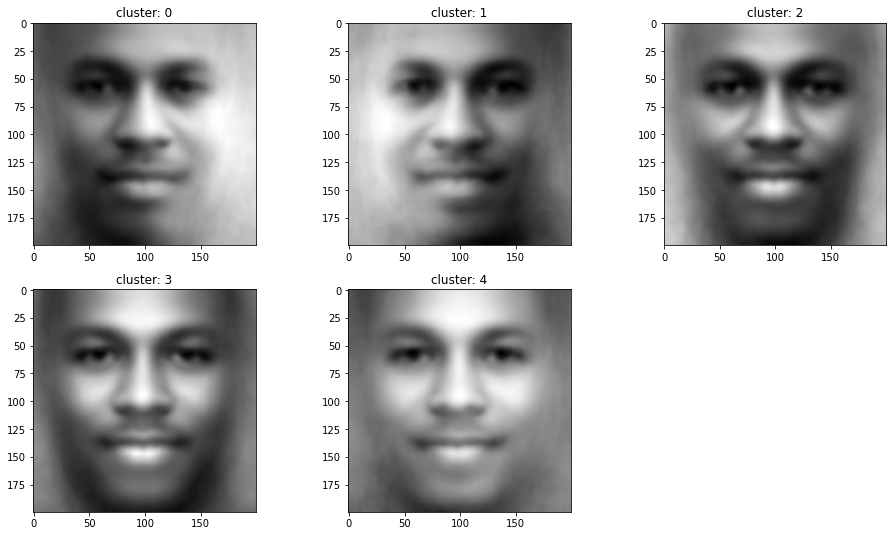

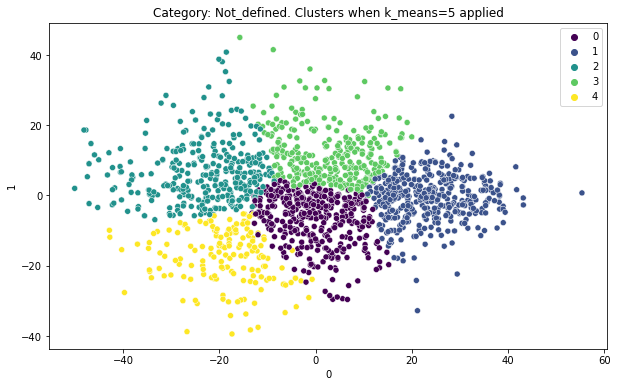

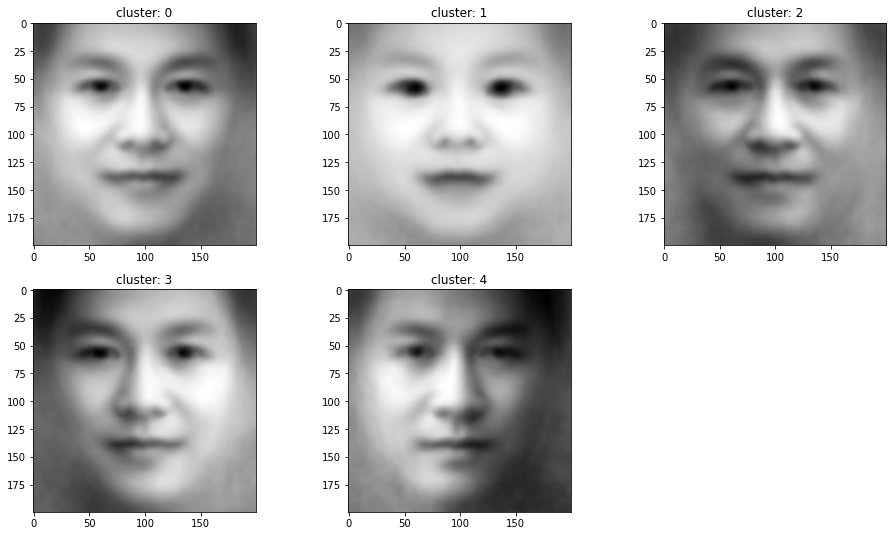

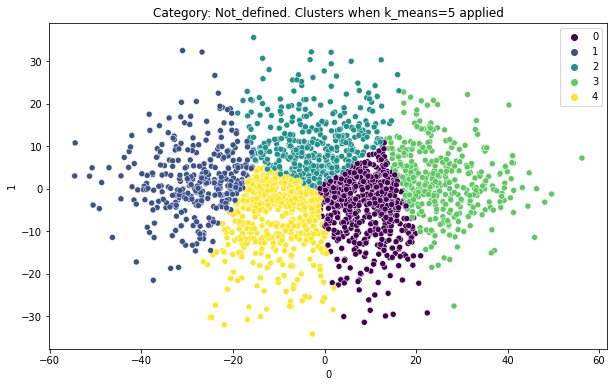

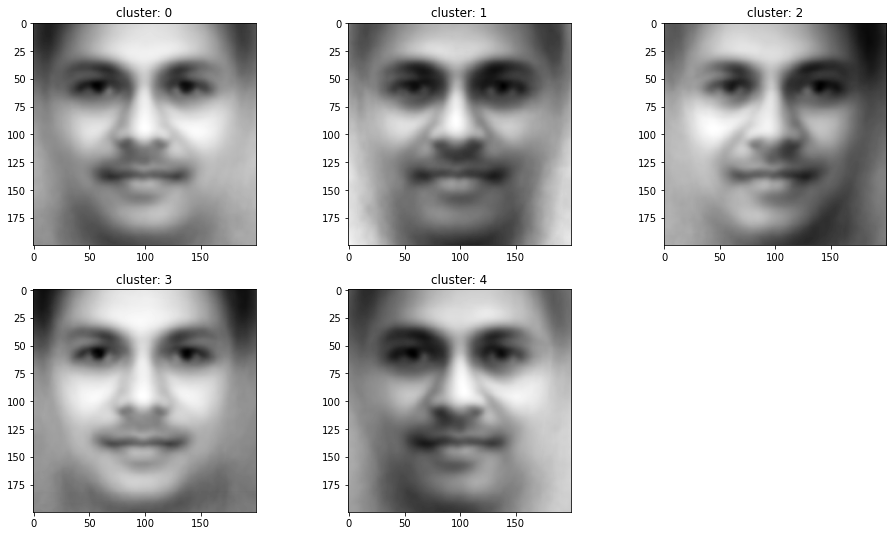

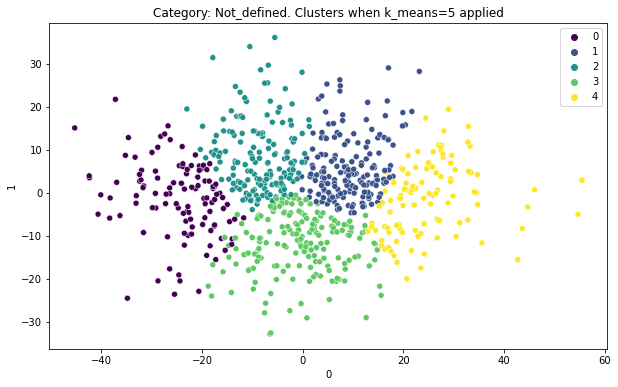

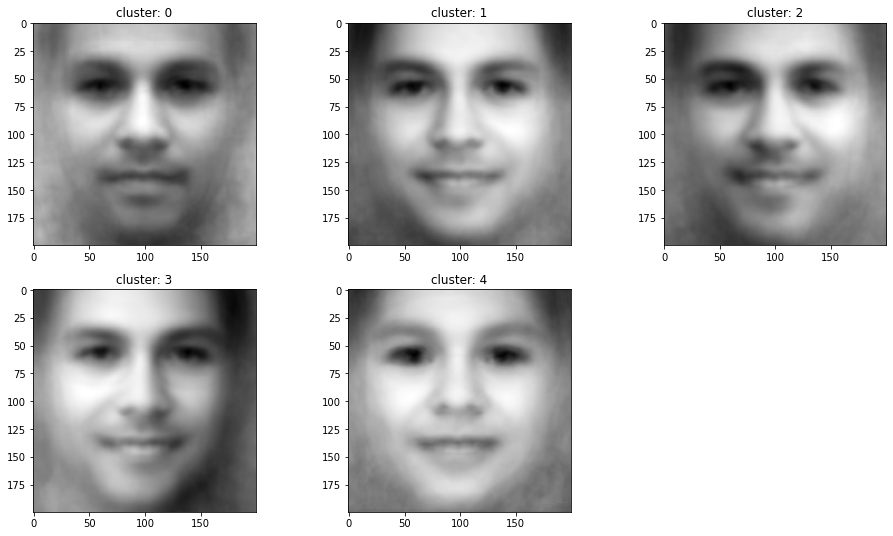

In [28]:
def mean_face_per_category_ellipse(category):
    subset=X[categories==category]
    [pca_s,S,_]=PCA_per_category_ellipse(category,plot=False)
    pred=run_Kmeans(pca_s,S,plot=True)
    plt.figure(figsize=(16,9))
    for i in range(0,5):
        plt.subplot(2,3,i+1)
        subs_0=subset[pred==i]
        mean_img_0=np.mean(subs_0,axis=0)
        plt.title("cluster: "+str(i))
        plt.imshow(mean_img_0.reshape(200,200),cmap='gray')
        
for i in range(0,5):
    mean_face_per_category_ellipse(i)

## Elbow method all categories

In [29]:
def run_Kmeans(pca_scores,Scores_df,clusters=5,plot=True,category="Not_defined"):
    # Declaring Model
    model = KMeans(n_clusters=clusters)
    # Fitting Model
    model.fit(pca_scores)
    # Prediction on the subset data
    all_predictions = model.predict(pca_scores)
    centroids = model.cluster_centers_
    curr_sse = 0
    
    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
    for j in range(len(pca_scores)):
        curr_center = centroids[all_predictions[j]]
        curr_sse += (pca_s[j, 0] - curr_center[0]) ** 2 + (pca_s[j, 1] - curr_center[1]) ** 2


    if plot==True:
        plt.figure(figsize=(10,6));sns.scatterplot(Scores_df[0],Scores_df[1],hue=all_predictions,palette="viridis");
        plt.title('Category: '+str(category)+'. Clusters when k_means=%d applied'%clusters);plt.savefig(category+".png");plt.show()
    return all_predictions,centroids,curr_sse

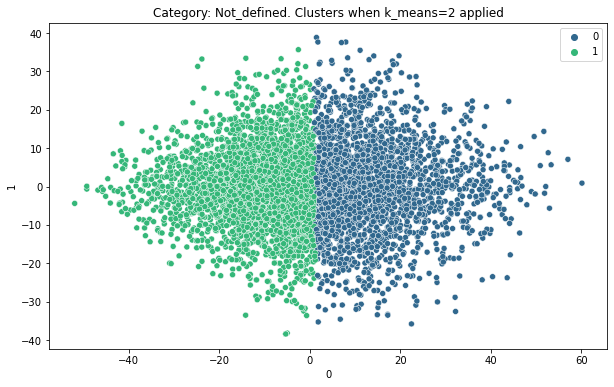

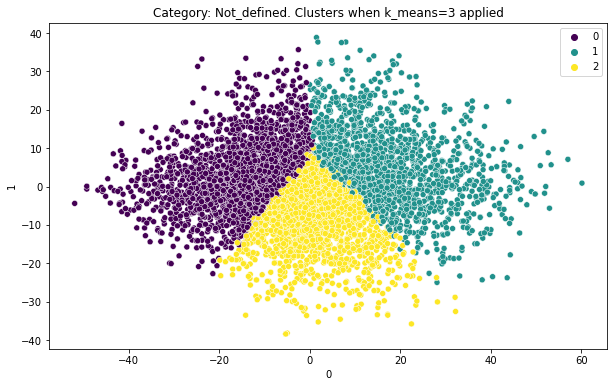

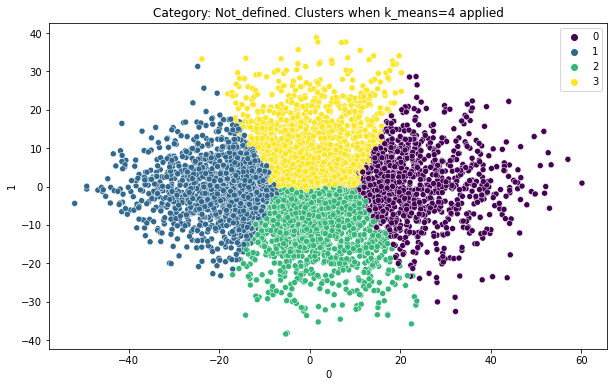

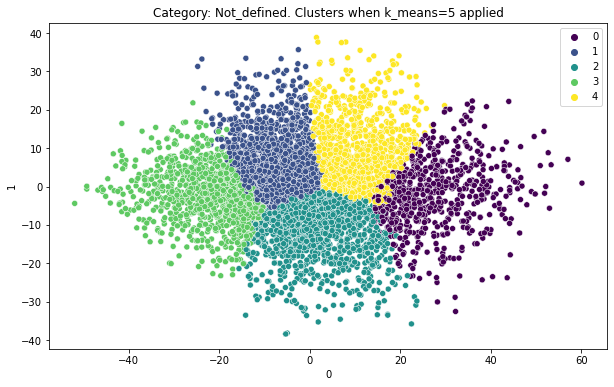

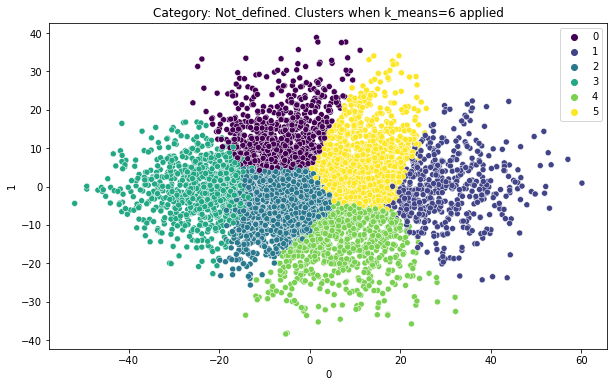

...

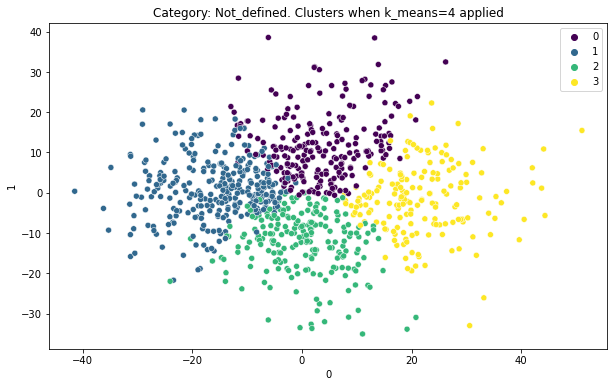

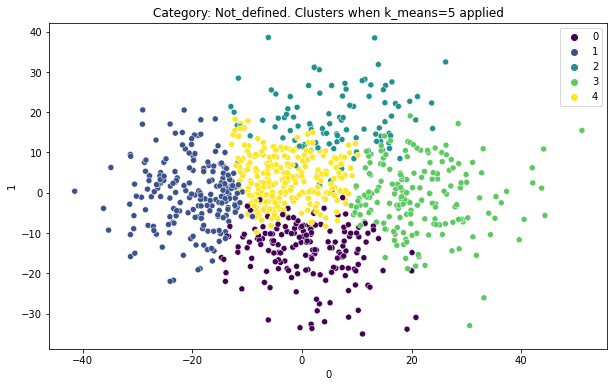

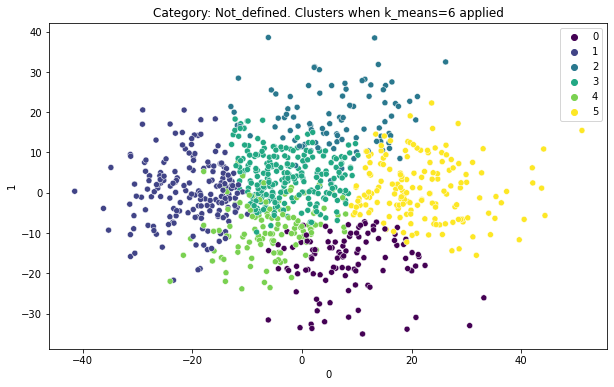

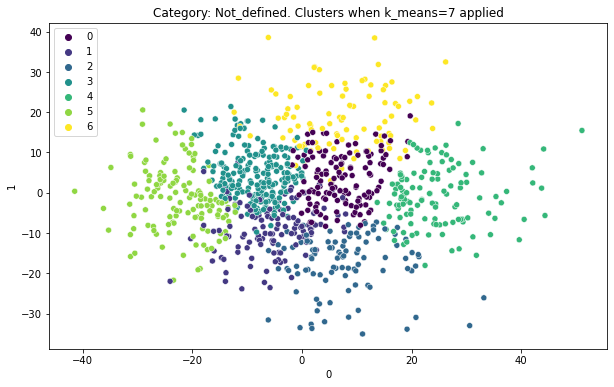

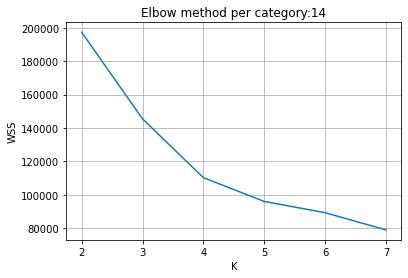

In [30]:
for el in np.unique(categories):
    kelbow=[]
    [pca_s,S,_]=PCA_per_category_ellipse(el,plot=False)
    for i in range(2,8):
        [pred,_,sse]=run_Kmeans(pca_s,S,clusters=i,plot=True)
        kelbow.append(sse)
        #mydict=analyze_cluster(kmeans, Xsub)
    #Plot elbow method:
    plt.figure(figsize=(6,4))
    plt.plot(list(np.arange(2,8)),kelbow)
    plt.title("Elbow method per category:%d"%el);plt.xlabel("K");plt.ylabel("WSS");plt.grid()
    plt.savefig("Elbow%d.png"%el);plt.show()

In [31]:
# optimal number of clusters per category by using elbow method (Visual inspection)
elbow_opt=[4,4,4,3,4,5,4,4,4,5]

### Age analysis per cluster

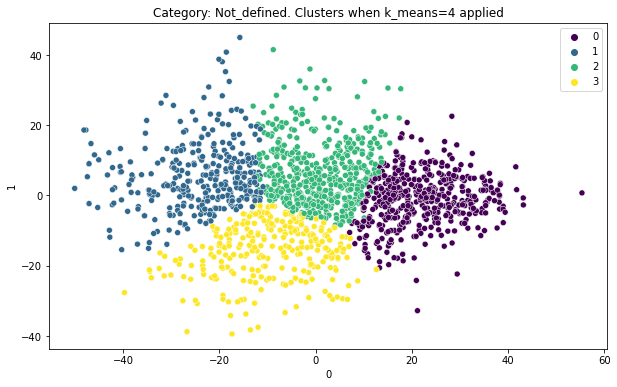

In [32]:
[pca_s,S,age_s]=PCA_per_category_ellipse(2,plot=False)
[pred,centroids,sse]=run_Kmeans(pca_s,S,clusters=4,plot=True)

In [33]:
age_s

array([26, 77, 26, ..., 88, 35,  6], dtype=uint8)

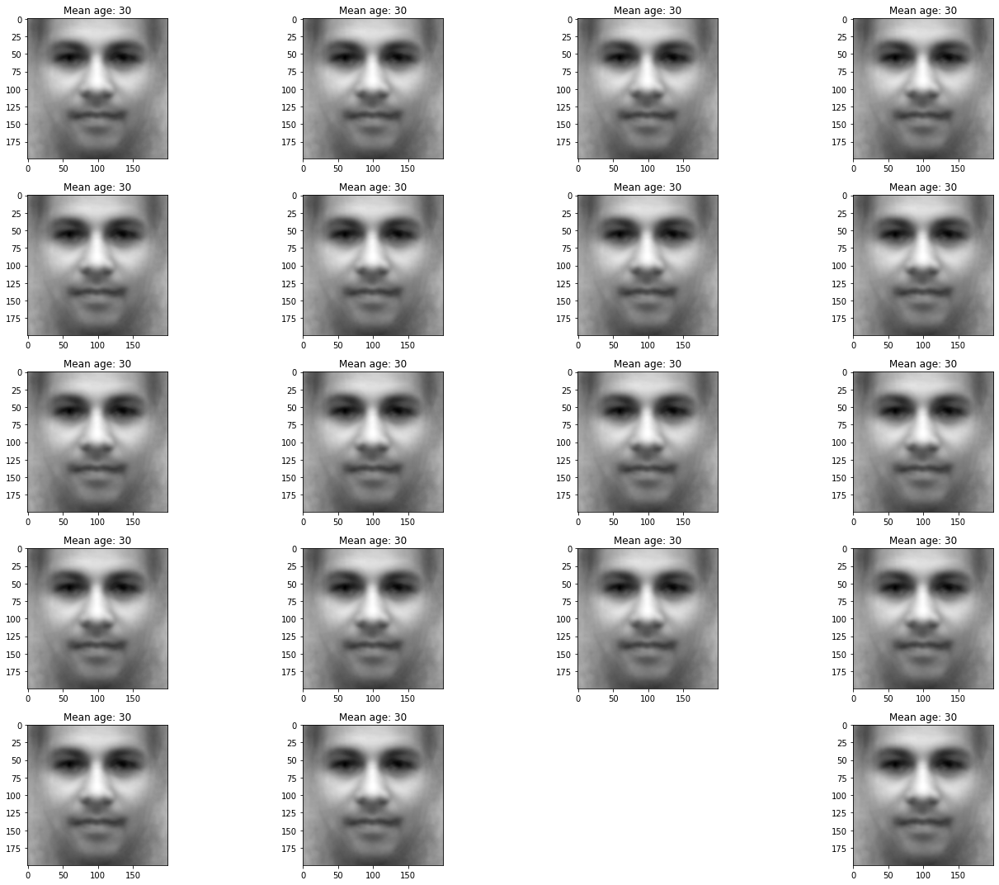

In [70]:
idx=1
plt.figure(figsize=(20,15))
for cat in range(0,5):
    for i in range(0,4):
        plt.subplot(5,4,idx)
        idx+=1
        plt.title("Mean age: %d"%mean_age)
        plt.imshow(mean_img_0.reshape(200,200),cmap='gray')
        plt.tight_layout()
plt.show()

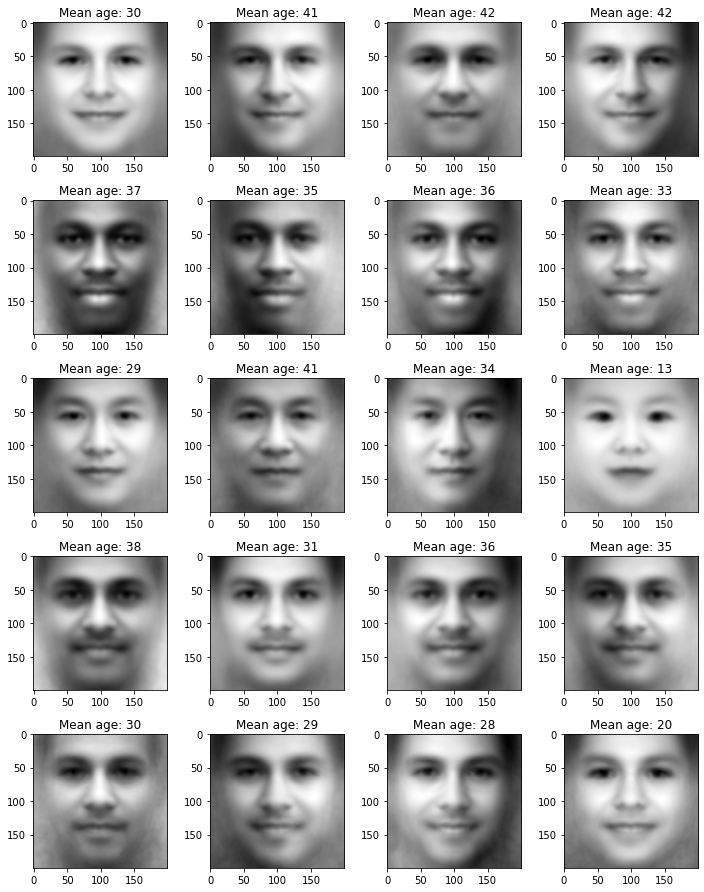

In [76]:
idx=1
plt.figure(figsize=(10,12.5))
for cat in range(0,5):
    subset=X[categories==cat]
    [pca_s,S,age_s]=PCA_per_category_ellipse(cat,plot=False)
    [pred,_,_]=run_Kmeans(pca_s,S,clusters=4,plot=False)
    for i in range(0,4):
        plt.subplot(5,4,idx)
        idx+=1
        # mean age:
        mean_age=np.mean(age_s[pred==i])
        max_age=max(age_s[pred==i])
        min_age=min(age_s[pred==i])
        subs_0=subset[pred==i]
        mean_img_0=np.mean(subs_0,axis=0)
        plt.title("Mean age: %d"%mean_age)
        plt.imshow(mean_img_0.reshape(200,200),cmap='gray')
plt.tight_layout()
plt.savefig('men.png')
plt.show()

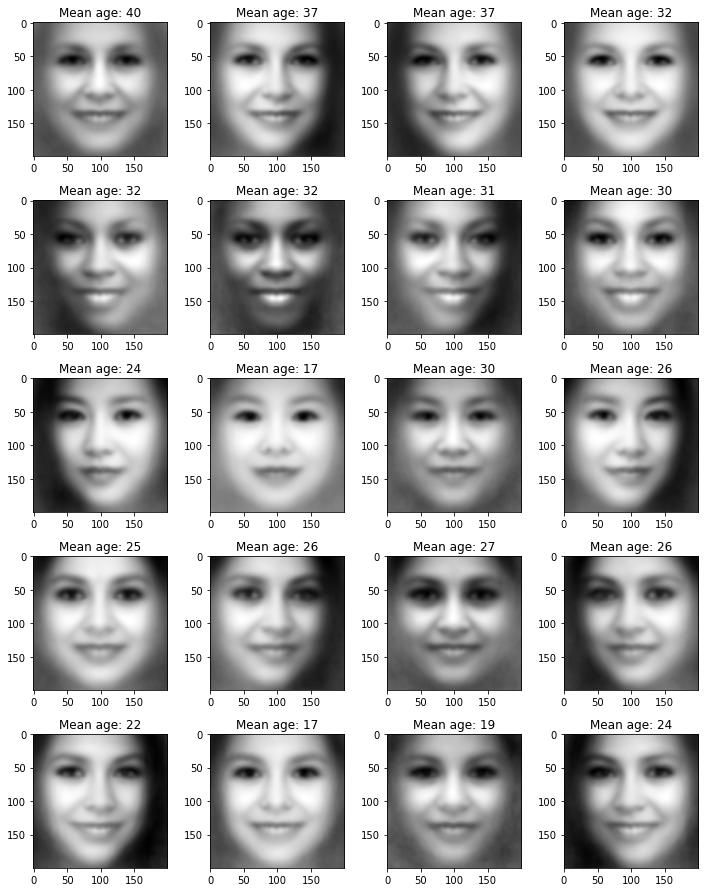

In [77]:
idx=1
plt.figure(figsize=(10,12.5))
for cat in range(10,15):
    subset=X[categories==cat]
    [pca_s,S,age_s]=PCA_per_category_ellipse(cat,plot=False)
    [pred,_,_]=run_Kmeans(pca_s,S,clusters=4,plot=False)
    for i in range(0,4):
        plt.subplot(5,4,idx)
        idx+=1
        # mean age:
        mean_age=np.mean(age_s[pred==i])
        max_age=max(age_s[pred==i])
        min_age=min(age_s[pred==i])
        subs_0=subset[pred==i]
        mean_img_0=np.mean(subs_0,axis=0)
        plt.title("Mean age: %d"%mean_age)
        plt.imshow(mean_img_0.reshape(200,200),cmap='gray')
plt.tight_layout()
plt.savefig('women.png')
plt.show()

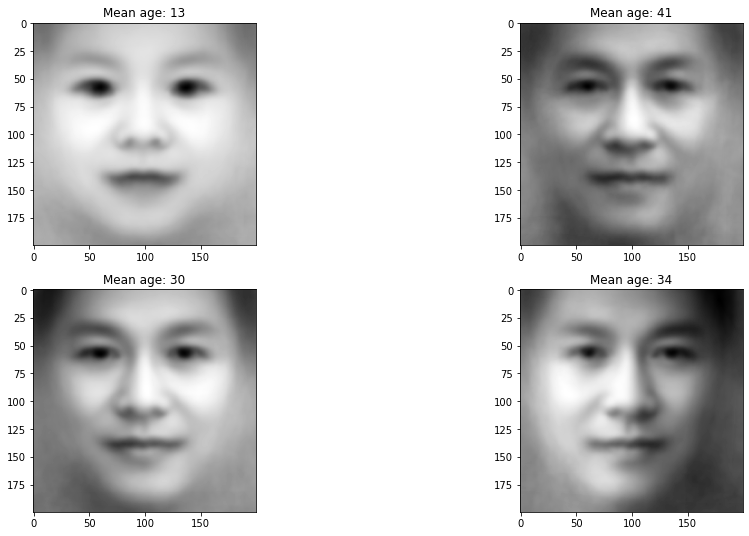

In [45]:
subset=X[categories==2]
[pca_s,S,age_s]=PCA_per_category_ellipse(2,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=4,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,4):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d"%mean_age)
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

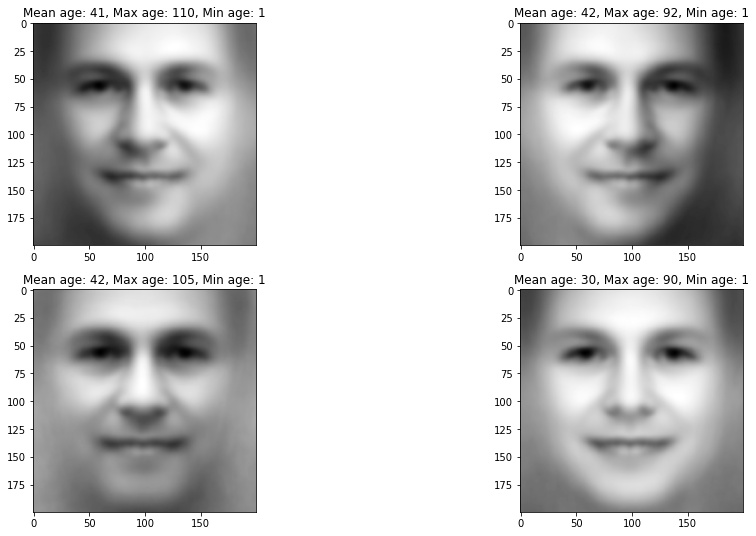

In [36]:
subset=X[categories==0]
[pca_s,S,age_s]=PCA_per_category_ellipse(0,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=4,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,4):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

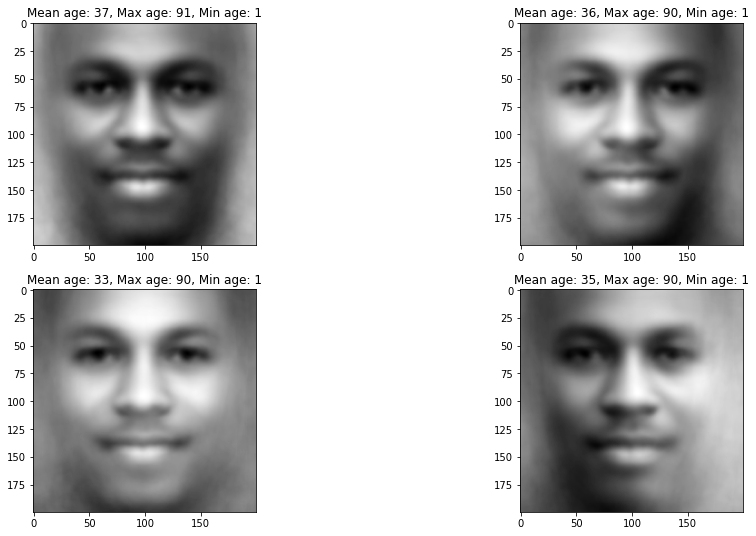

In [37]:
category=1
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=4,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,4):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

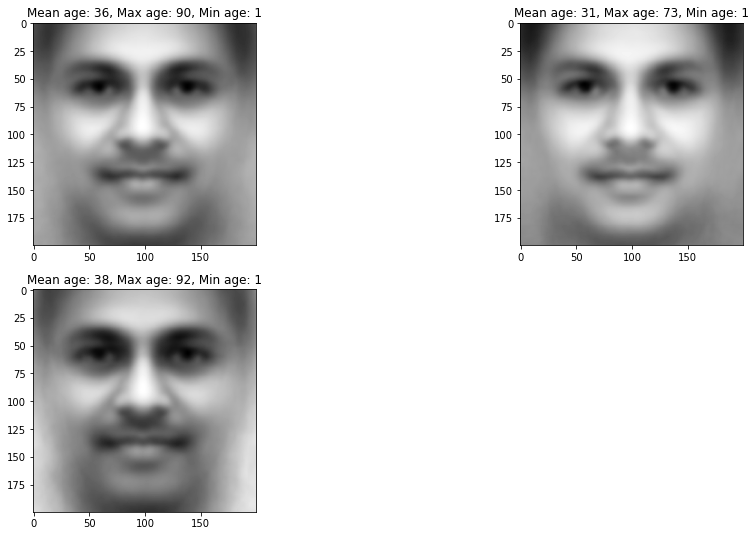

In [38]:
category=3;clusts=3
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

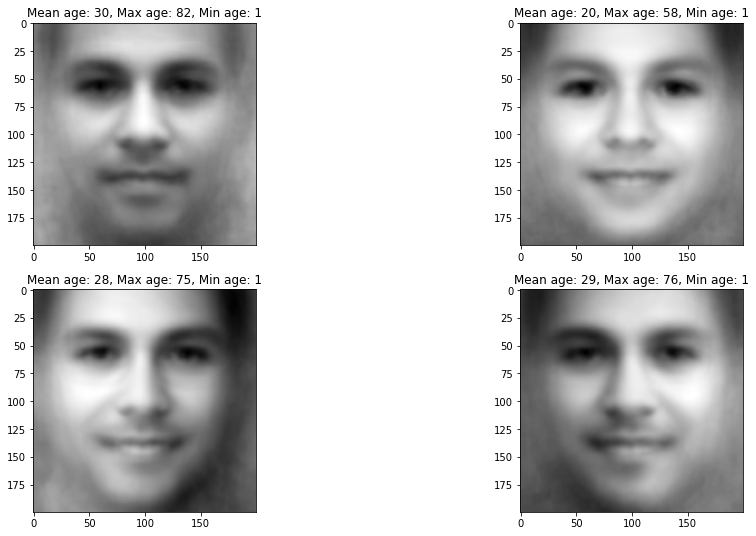

In [39]:
category=4;clusts=4
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

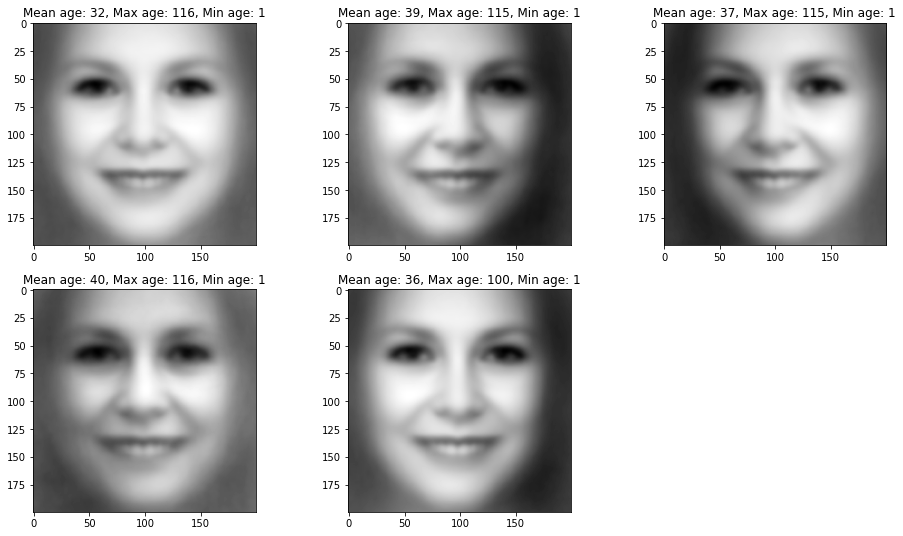

In [40]:
category=10;clusts=5
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,3,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

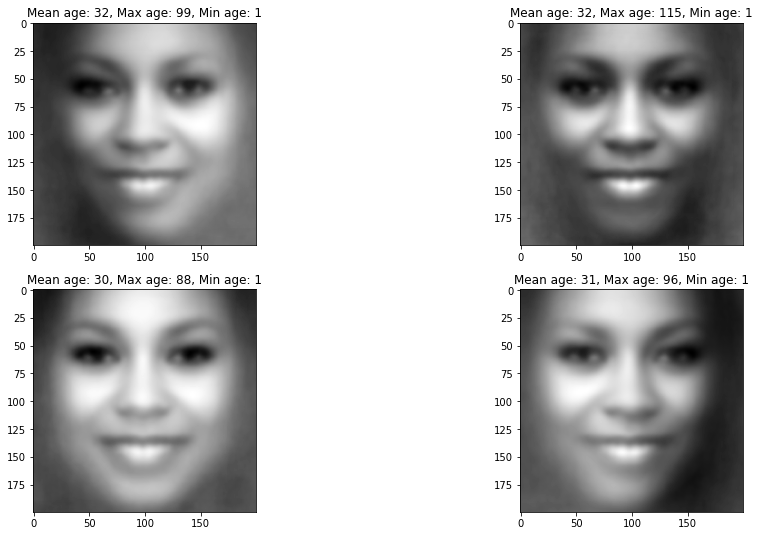

In [41]:
category=11;clusts=4
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

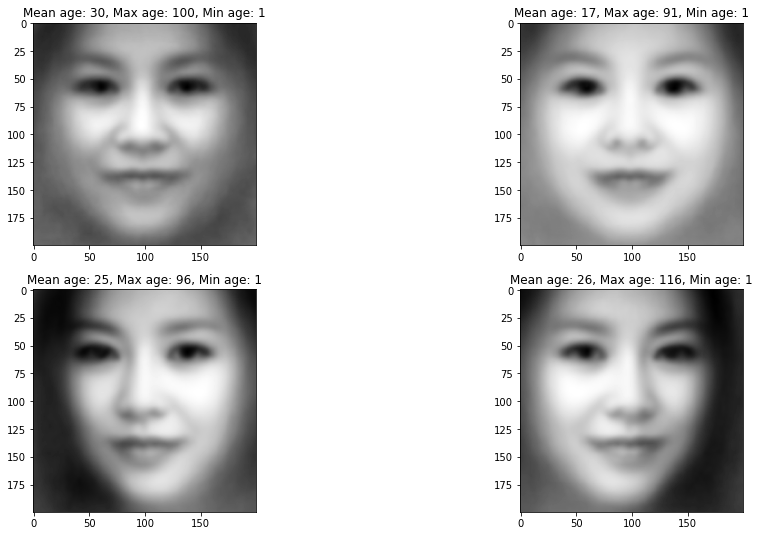

In [42]:
category=12;clusts=4
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

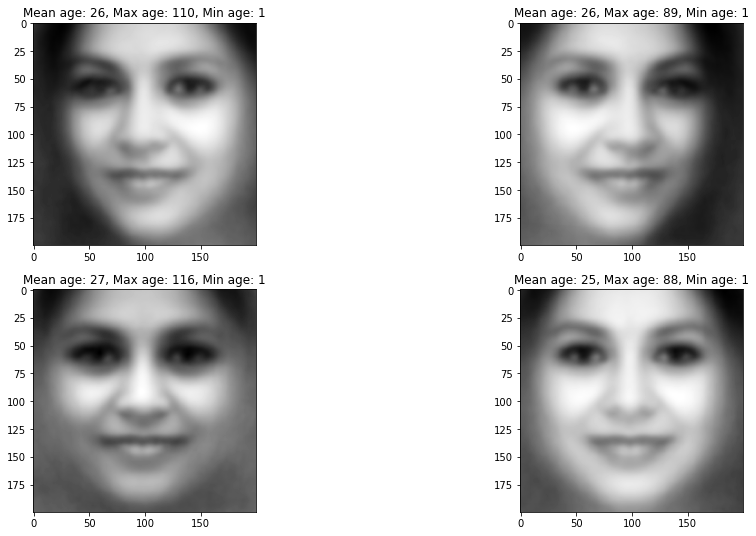

In [43]:
category=13;clusts=4
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,2,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')

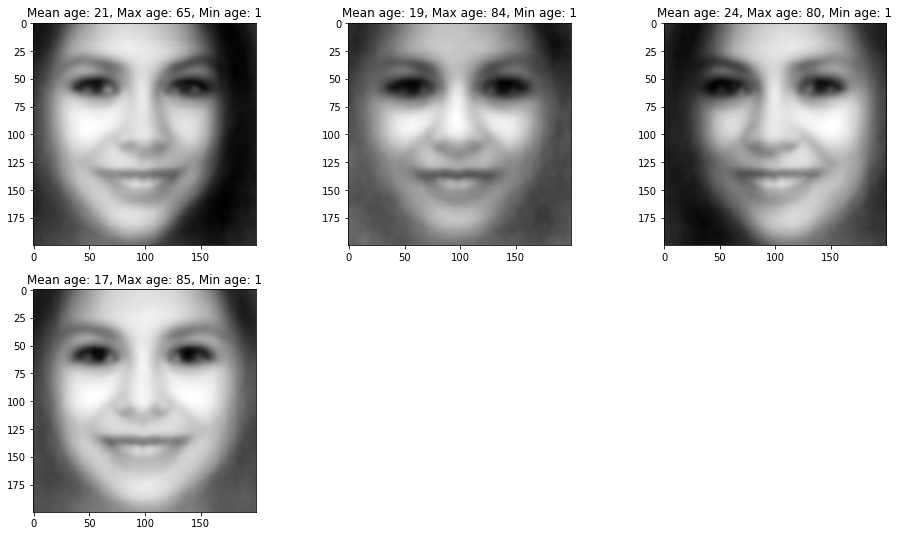

In [44]:
category=14;clusts=4
subset=X[categories==category]
[pca_s,S,age_s]=PCA_per_category_ellipse(category,plot=False)
[pred,_,_]=run_Kmeans(pca_s,S,clusters=clusts,plot=False)
plt.figure(figsize=(16,9))
for i in range(0,clusts):
    plt.subplot(2,3,i+1)
    # mean age:
    mean_age=np.mean(age_s[pred==i])
    max_age=max(age_s[pred==i])
    min_age=min(age_s[pred==i])
    subs_0=subset[pred==i]
    mean_img_0=np.mean(subs_0,axis=0)
    plt.title("Mean age: %d, Max age: %d, Min age: %d"%(mean_age,max_age,min_age))
    plt.imshow(mean_img_0.reshape(200,200),cmap='gray')